In [1]:
import pandas as pd
import numpy as np
import gzip
import json
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import string
from nltk.corpus import stopwords
from sklearn.linear_model import LogisticRegression
from nltk.stem import PorterStemmer
from sklearn.feature_extraction.text import CountVectorizer
from collections import defaultdict
from sklearn.metrics import mean_squared_error as MSE
import random
import scipy

color = sns.color_palette()

%matplotlib inline

In [3]:
from imblearn.over_sampling import SMOTE
from sklearn.metrics import f1_score

In [85]:
import json
i = 0
data = []
# read file
with open('yelp_academic_dataset_review.json', 'r') as myfile:
    
    for d in myfile.readlines():
        i += 1
        j = json.loads(d)
        data.append(j)
        if i >= 500000:
            break



In [105]:
yelp = pd.DataFrame(data).iloc[:50000]
yelp['stars'].value_counts(normalize = True)

5.0    0.44542
4.0    0.22124
1.0    0.14490
3.0    0.10934
2.0    0.07910
Name: stars, dtype: float64

In [87]:
# user_vc = yelp['user_id'].value_counts()
# target_users = list(user_vc[user_vc >= 10].index)
# yelp = yelp[yelp['user_id'].apply(lambda x: x in target_users)]

In [106]:
yelp.head()

,business_id,cool,date,funny,review_id,stars,text,useful,user_id
0,ujmEBvifdJM6h6RLv4wQIg,0,2013-05-07 04:34:36,1,Q1sbwvVQXV2734tPgoKj4Q,1.0,Total bill for this horrible service? Over $8G...,6,hG7b0MtEbXx5QzbzE6C_VA
1,NZnhc2sEQy3RmzKTZnqtwQ,0,2017-01-14 21:30:33,0,GJXCdrto3ASJOqKeVWPi6Q,5.0,I *adore* Travis at the Hard Rock's new Kelly ...,0,yXQM5uF2jS6es16SJzNHfg
2,WTqjgwHlXbSFevF32_DJVw,0,2016-11-09 20:09:03,0,2TzJjDVDEuAW6MR5Vuc1ug,5.0,I have to say that this office really has it t...,3,n6-Gk65cPZL6Uz8qRm3NYw
3,ikCg8xy5JIg_NGPx-MSIDA,0,2018-01-09 20:56:38,0,yi0R0Ugj_xUx_Nek0-_Qig,5.0,Went in for a lunch. Steak sandwich was delici...,0,dacAIZ6fTM6mqwW5uxkskg
4,b1b1eb3uo-w561D0ZfCEiQ,0,2018-01-30 23:07:38,0,11a8sVPMUFtaC7_ABRkmtw,1.0,Today was my second out of three sessions I ha...,7,ssoyf2_x0EQMed6fgHeMyQ


In [107]:
len(yelp)

50000

In [108]:
train = yelp.iloc[:40000]
validation = yelp.iloc[40000:45000]
test = yelp.iloc[45000:]

## Exploratory Data Analysis

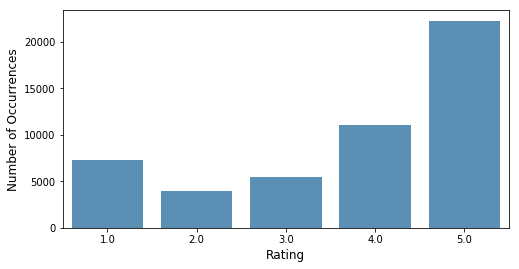

In [9]:
val_ct = yelp['stars'].value_counts() 
plt.figure(figsize=(8,4))
sns.barplot(val_ct.index, val_ct.values, alpha=0.8, color=color[0])
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Rating', fontsize=12)
plt.show()

In [10]:
yelp['stars'].describe()

count    50000.000000
mean         3.743180
std          1.452359
min          1.000000
25%          3.000000
50%          4.000000
75%          5.000000
max          5.000000
Name: stars, dtype: float64

In [288]:
user_gb = yelp.groupby('user_id')['review_id'].count()

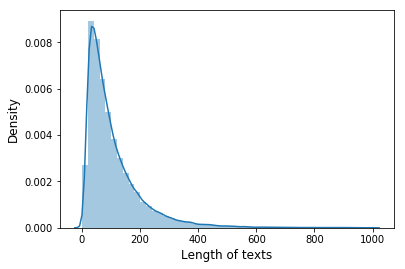

In [27]:
sns.distplot(yelp['text'].apply(lambda x: len(x.split())), kde=True, rug=False)
plt.ylabel('Density', fontsize=12)
plt.xlabel('Length of texts', fontsize=12)
plt.show()

In [28]:
yelp['text'].apply(lambda x: len(x.split())).describe()

count    50000.000000
mean       108.174700
std        101.545144
min          1.000000
25%         43.000000
50%         77.000000
75%        138.000000
max        997.000000
Name: text, dtype: float64

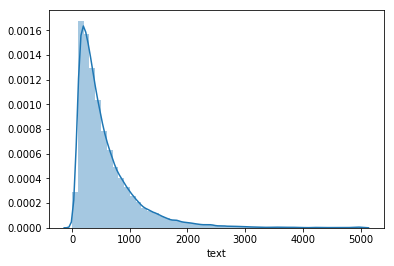

In [26]:
sns.distplot(yelp['text'].apply(lambda x: len(x)), kde=True, rug=False)

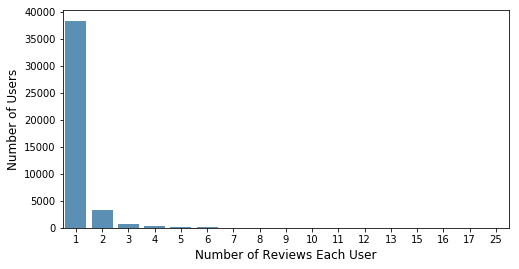

In [43]:
user_gb = yelp.groupby('user_id')['text'].count()
val_ct = user_gb.value_counts()
plt.figure(figsize=(8,4))
sns.barplot(val_ct.index, val_ct.values, alpha=0.8, color=color[0])
plt.ylabel('Number of Users', fontsize=12)
plt.xlabel('Number of Reviews Each User', fontsize=12)
plt.show()

In [34]:
MSE([train['stars'].mean()] * len(test), test['stars'])

2.0639357425

In [35]:
MSE([5] * len(test), test['stars'])

3.5722

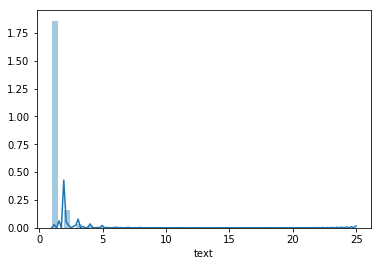

In [42]:
sns.distplot(yelp.groupby('user_id')['text'].count(), kde=True, rug=False)

In [46]:
yelp['text_length'] = yelp['text'].apply(lambda x: len(x))

In [53]:
#yelp[yelp['stars'] == 1]['text_length']

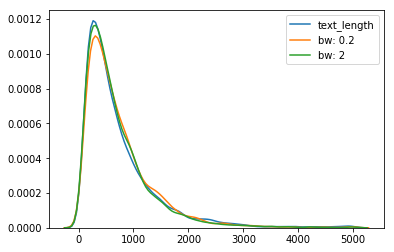

In [56]:
sns.kdeplot(yelp[yelp['stars'] == 1]['text_length'])
sns.kdeplot(yelp[yelp['stars'] == 2]['text_length'], label="bw: 0.2")
sns.kdeplot(yelp[yelp['stars'] == 3]['text_length'], label="bw: 2")
plt.legend();

In [57]:
yelp.groupby('stars')['text_length'].mean()

stars
1.0    735.945480
2.0    733.295322
3.0    695.928114
4.0    610.728259
5.0    469.460240
Name: text_length, dtype: float64

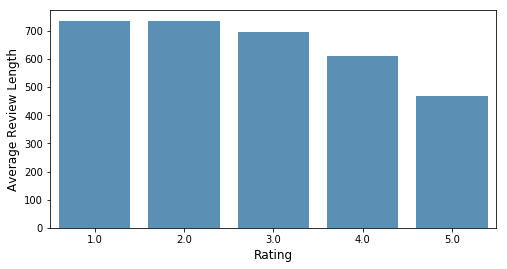

In [49]:
val_ct = yelp.groupby('stars')['text_length'].mean()
plt.figure(figsize=(8,4))
sns.barplot(val_ct.index, val_ct.values, alpha=0.8, color=color[0])
plt.ylabel('Average Review Length', fontsize=12)
plt.xlabel('Rating', fontsize=12)
plt.show()

In [45]:
3371 / 50000

0.06742

In [7]:
from wordcloud import WordCloud

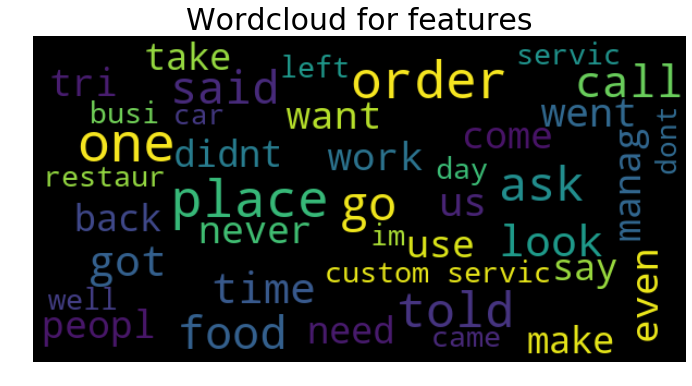

In [40]:
onestar_reviews = yelp[yelp['stars'] == 1]['text']
onestar_text = ''
for r in onestar_reviews:
    onestar_text = " ".join([onestar_text, " ".join(r.strip().split())])
onestar_text = onestar_text.strip()
onestar_text = clean_text(onestar_text)

plt.figure(figsize=(12,6))
wordcloud = WordCloud(width=600, height=300, max_font_size=50, max_words=40).generate(onestar_text)
wordcloud.recolor()
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.title("Wordcloud for features", fontsize=30)
plt.axis("off")
plt.show()

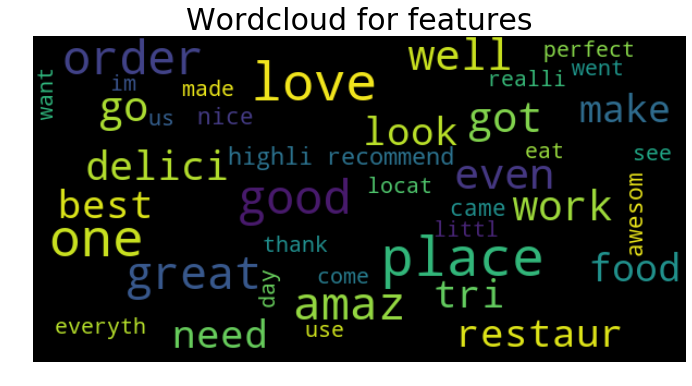

In [38]:
fivestar_reviews = yelp[yelp['stars'] == 5]['text']
fivestar_text = ''
for r in fivestar_reviews:
    fivestar_text = " ".join([fivestar_text, " ".join(r.strip().split())])
fivestar_text = fivestar_text.strip()
fivestar_text = clean_text(fivestar_text)

plt.figure(figsize=(12,6))
wordcloud = WordCloud(width=600, height=300, max_font_size=50, max_words=40).generate(fivestar_text)
wordcloud.recolor()
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.title("Wordcloud for features", fontsize=30)
plt.axis("off")
plt.show()

In [39]:
fivestar_text

'ador travi hard rock new kelli cardena salon im alway fan great blowout stranger chain offer servic howev travi taken flawless blowout whole new level traviss greet perfectli green swoosh otherwis perfectli style black hair vegasworthi rockstar outfit next come relax incred shampoo get full head messag could cure even worst migrain minut scent shampoo room travi freakishli strong finger good way use perfect amount pressur superb start gloriou blowout one two three peopl involv best roundbrush action hair ever seen team stylist clearli get along extrem well evid way talk help one anoth realli genuin corpor requir much fun next travi start flat iron way flip wrist get volum around without overdo make look like texa pagent girl admir also worth note didnt fri hair someth ive happen less skill stylist end blowout style hair perfectli bouncey look terrif thing better awesom blowout last day travi see everi singl time im vega make feel beauuuuti say offic realli togeth organ friendli dr j p

In [41]:
onestar_text

'total bill horribl servic 8g crook actual nerv charg us 69 3 pill check onlin pill 19 cent avoid hospit er cost today second three session paid although first session went well could tell meredith particular enjoy male client femal howev return teeth fine pleas result went today whiten room three gentlemen appoint start well although person servic industri alway attend femal clientel first coupl arriv unboth sign wait turn check origin 30 minut timer ask ok attend boyfriend numer occas well men would exit room without even ask look see irrit half way anoth woman show explain deal lobbi admit timer must reset half way process reset boyfriend left rest gentleman furthest away time come redeem deal get set gave timer done left point time 10 minut reset 5 minut ago accord sat patient whole time major pain gum watch time lamp shut reset two other explain deal guest never check time light turn releas stanc mouth relax state assum get thirti minut session instead usual 45 yet come point teet

In [36]:
fivestar_text[:100] == onestar_text[:100]

False

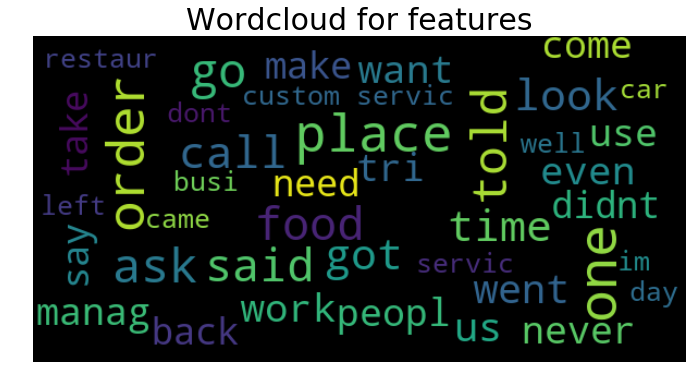

In [20]:
plt.figure(figsize=(12,6))
wordcloud = WordCloud(width=600, height=300, max_font_size=50, max_words=40).generate(fivestar_text)
wordcloud.recolor()
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.title("Wordcloud for features", fontsize=30)
plt.axis("off")
plt.show()

In [26]:
fivestar_text

'total bill horribl servic 8g crook actual nerv charg us 69 3 pill check onlin pill 19 cent avoid hospit er cost today second three session paid although first session went well could tell meredith particular enjoy male client femal howev return teeth fine pleas result went today whiten room three gentlemen appoint start well although person servic industri alway attend femal clientel first coupl arriv unboth sign wait turn check origin 30 minut timer ask ok attend boyfriend numer occas well men would exit room without even ask look see irrit half way anoth woman show explain deal lobbi admit timer must reset half way process reset boyfriend left rest gentleman furthest away time come redeem deal get set gave timer done left point time 10 minut reset 5 minut ago accord sat patient whole time major pain gum watch time lamp shut reset two other explain deal guest never check time light turn releas stanc mouth relax state assum get thirti minut session instead usual 45 yet come point teet

In [28]:
clean_text(onestar_text)

'total bill horribl servic 8g crook actual nerv charg us 69 3 pill check onlin pill 19 cent avoid hospit er cost today second three session paid although first session went well could tell meredith particular enjoy male client femal howev return teeth fine pleas result went today whiten room three gentlemen appoint start well although person servic industri alway attend femal clientel first coupl arriv unboth sign wait turn check origin 30 minut timer ask ok attend boyfriend numer occas well men would exit room without even ask look see irrit half way anoth woman show explain deal lobbi admit timer must reset half way process reset boyfriend left rest gentleman furthest away time come redeem deal get set gave timer done left point time 10 minut reset 5 minut ago accord sat patient whole time major pain gum watch time lamp shut reset two other explain deal guest never check time light turn releas stanc mouth relax state assum get thirti minut session instead usual 45 yet come point teet

In [91]:
reviewsPerUser = {}
reviewsPerItem = {}

In [92]:
for u, b, r in train[['user_id', 'business_id', 'stars']].values:
    reviewsPerUser[u] = r
    reviewsPerItem[b] = r

In [93]:
users = list(reviewsPerUser.keys())
items = list(reviewsPerItem.keys())

In [94]:
alpha = np.mean(train['stars'])
userBiases = defaultdict(float)
itemBiases = defaultdict(float)
userGamma = {}
itemGamma = {}
nUsers = len(reviewsPerUser)
nItems = len(reviewsPerItem)
K = 150

In [95]:
count = 0

In [96]:
for u in reviewsPerUser:
    userGamma[u] = [random.random() * 0.1 - 0.05 for k in range(K)]
for i in reviewsPerItem:
    itemGamma[i] = [random.random() * 0.1 - 0.05 for k in range(K)]

In [97]:
def unpack(theta):
    global alpha
    global userBiases
    global itemBiases
    global userGamma
    global itemGamma
    index = 0
    alpha = theta[index]
    index += 1
    userBiases = dict(zip(users, theta[index: index + nUsers]))
    index += nUsers
    itemBiases = dict(zip(items, theta[index: index + nItems]))
    index += nItems
    for u in users:
        userGamma[u] = theta[index: index+K]
        index += K
    for i in items:
        itemGamma[i] = theta[index: index+K]
        index += K
        
def inner(x, y):
    return sum([a*b for a,b in zip(x,y)])

def prediction(user, item):
    if user not in userBiases.keys() and item not in itemBiases.keys():
        return alpha
    if user not in userBiases.keys():
        return alpha + itemBiases[item]
    if item not in itemBiases.keys():
        return alpha + userBiases[user]
    return alpha + userBiases[user] + itemBiases[item] + \
        inner(userGamma[user], itemGamma[item])

In [98]:
def cost(theta, labels, lamb):
    unpack(theta)
    predictions = [prediction(user, item) for user,item,_ in train[['user_id', 'business_id', 'stars']].values]
    cost = MSE(predictions, labels)
    print('MSE = ' + str(cost))
    for u in users:
        cost += lamb*userBiases[u]**2
        for k in range(K):
            cost += lamb*userGamma[u][k]**2
    for i in items:
        cost += lamb*itemBiases[i]**2
        for k in range(K):
            cost += lamb*itemGamma[i][k]**2
    return cost

def derivative(theta, labels, lamb):
    unpack(theta)
    N = len(train)
    dalpha = 0
    dUserBiases = defaultdict(float)
    dItemBiases = defaultdict(float)
    dUserGamma = {}
    dItemGamma = {}
    for u in reviewsPerUser:
        dUserGamma[u] = [0.0 for k in range(K)]
    for i in reviewsPerItem:
        dItemGamma[i] = [0.0 for k in range(K)]
    for u,i,r in train[['user_id', 'business_id', 'stars']].values:
        pred = prediction(u, i)
        diff = pred - r
        dalpha += 2/N*diff
        dUserBiases[u] += 2/N*diff
        dItemBiases[i] += 2/N*diff
        for k in range(K):
            dUserGamma[u][k] += 2/N*itemGamma[i][k]*diff
            dItemGamma[i][k] += 2/N*userGamma[u][k]*diff
    for u in userBiases:
        dUserBiases[u] += 2*lamb*userBiases[u]
        for k in range(K):
            dUserGamma[u][k] += 2*lamb*userGamma[u][k]
    for i in itemBiases:
        dItemBiases[i] += 2*lamb*itemBiases[i]
        for k in range(K):
            dItemGamma[i][k] += 2*lamb*itemGamma[i][k]
    dtheta = [dalpha] + [dUserBiases[u] for u in users] + [dItemBiases[i] for i in items]
    for u in users:
        dtheta += dUserGamma[u]
    for i in items:
        dtheta += dItemGamma[i]
    return np.array(dtheta)
            

In [99]:
labels = train['stars']
ratingMean = np.mean(train['stars'])


In [100]:
x0 = [ratingMean] + [random.random() * 0.1 - 0.05 for k in range(nUsers*(K+1) + nItems*(K+1))] 

In [101]:
scipy.optimize.fmin_l_bfgs_b(cost, x0, derivative, args = (labels, 0.0001), epsilon = 0.05)

MSE = 1.229371098013453
MSE = 1.217125957915143
MSE = 1.1917908231992194
MSE = 1.1094325983579654
MSE = 1.0283825526697623
MSE = 1.020105162307212
MSE = 0.9924159357864355
MSE = 0.9259545704601256
MSE = 0.8712145691254551
MSE = 0.8112321596316909
MSE = 0.7928458540262451
MSE = 0.7716252705717689
MSE = 0.7437539256244772
MSE = 0.7160543066354027
MSE = 0.7234345182364444
MSE = 0.7172612145961144
MSE = 0.7162957032637646
MSE = 0.7167776321985342
MSE = 0.7168387995571625
MSE = 0.716547217711183
MSE = 0.7158120993178892
MSE = 0.7123463102156842
MSE = 0.7128524828892876
MSE = 0.7092512924409122
MSE = 0.6988512891465879
MSE = 0.6845396508641426
MSE = 0.6704872457915043
MSE = 0.64486655343196
MSE = 0.6344784425435522
MSE = 0.6370246429065344
MSE = 0.6449697070019094
MSE = 0.6422370462826626
MSE = 0.6408904361378382
MSE = 0.6293586577386518
MSE = 0.6103817542194048
MSE = 0.6013989846202137
MSE = 0.5959527905329849
MSE = 0.5778070407118499
MSE = 0.5626438738551341
MSE = 0.5517802458225751
MSE = 

KeyboardInterrupt: 

lambda: 0.0001 epsilon: 0.001
1.8648378950334177, 1.824751385011238
lambda: 0.001 epsilon: 0.001
1.9856792413757638, 1.9392724884286443
lambda: 0.00001 epsilon: 0.001
1.9184749910660976, 1.8672852097092225


In [71]:
np.mean([(prediction(u,i) - r)**2 for u,i,r in train[['user_id', 'business_id', 'stars']].values])

0.8155949681209406

In [102]:
np.mean([(prediction(u,i) - r)**2 for u,i,r in validation[['user_id', 'business_id', 'stars']].values])

1.041628000192082

In [103]:
np.mean([(prediction(u,i) - r)**2 for u,i,r in test[['user_id', 'business_id', 'stars']].values])

1.0552390790200954

In [104]:
MSE([train['stars'].mean()]*len(validation), validation['stars'])

1.2260801200000002

In [17]:
porter = PorterStemmer()
stop_words = set(stopwords.words('english'))
def clean_text(review):

    review = ''.join([c for c in review.lower() if not c in string.punctuation])
    #     review = review.translate(str.maketrans('', '', string.punctuation))
    #     review = review.lower()  
    words = [w for w in review.split() if not w in stop_words]
    stemmed = [porter.stem(word) for word in words]
    return ' '.join(stemmed)


In [70]:
dataset = pd.DataFrame(data)
dataset.head()

,age,body type,bust size,category,fit,height,item_id,rating,rented for,review_date,review_summary,review_text,size,user_id,weight
0,28,hourglass,34d,romper,fit,"5' 8""",2260466,10,vacation,"April 20, 2016",So many compliments!,An adorable romper! Belt and zipper were a lit...,14,420272,137lbs
1,36,straight & narrow,34b,gown,fit,"5' 6""",153475,10,other,"June 18, 2013",I felt so glamourous!!!,I rented this dress for a photo shoot. The the...,12,273551,132lbs
2,116,NaN,NaN,sheath,fit,"5' 4""",1063761,10,party,"December 14, 2015",It was a great time to celebrate the (almost) ...,This hugged in all the right places! It was a ...,4,360448,NaN
3,34,pear,34c,dress,fit,"5' 5""",126335,8,formal affair,"February 12, 2014",Dress arrived on time and in perfect condition.,I rented this for my company's black tie award...,8,909926,135lbs
4,27,athletic,34b,gown,fit,"5' 9""",616682,10,wedding,"September 26, 2016",Was in love with this dress !!!,I have always been petite in my upper body and...,12,151944,145lbs


In [ ]:
dataset

In [4]:
dataset = pd.read_csv('rent.csv')
dataset['rating'] = dataset['rating'] // 2
dataset = dataset[dataset.apply(lambda x: pd.isnull(x)).sum(axis = 1) == 0]
dataset.head()

,Unnamed: 0,age,body type,category,fit,item_id,rating,rented for,review_date,review_summary,review_text,size,user_id,bust_size_num,bust_size_cup,height_cm,weight_lbs
0,143944,22,petite,mini,fit,152836,5,party,2016-11-09,Classy yet so sexy!,The only size they had at the time that I orde...,1,990873,32,d,157.48,108
1,156887,59,athletic,sheath,fit,173235,5,wedding,2014-10-14,So many compliments! even from my husband!,"Size 12 was a little more comfortable, but arm...",20,617626,38,b,172.72,155
2,62668,35,athletic,dress,small,130259,3,wedding,2015-07-07,Even The Sparkle Couldn't Save The Fit,I had orginally reserved a different dress for...,12,133861,36,c,167.64,130
3,72202,34,hourglass,top,small,2318793,5,work,2017-01-28,"Unusual pattern, very flattering, form-fitting...",I loved this top. It's kept v young by the swe...,12,67610,34,b,165.10,133
4,126404,28,hourglass,sheath,fit,137585,5,party,2015-11-23,Show stopper!,I wore this dress for my bachelorette party. I...,12,909464,32,d,177.80,145


In [7]:
dataset['review_text'] = dataset['review_text'].apply(clean_text)


In [8]:
train = dataset.iloc[:40000]
validation = dataset.iloc[40000:45000]
test = dataset.iloc[45000:]

In [9]:
train['rating'].mean()

4.539325

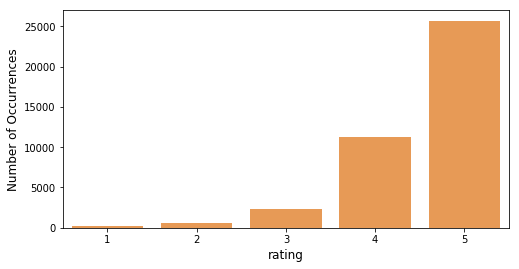

In [10]:
int_level = train['rating'].value_counts()

plt.figure(figsize=(8,4))
sns.barplot(int_level.index, int_level.values, alpha=0.8, color=color[1])
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('rating', fontsize=12)
plt.show()

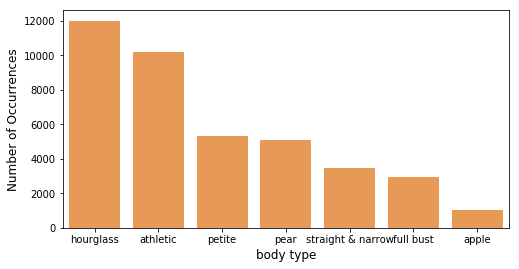

In [11]:
int_level = train['body type'].value_counts()

plt.figure(figsize=(8,4))
sns.barplot(int_level.index, int_level.values, alpha=0.8, color=color[1])
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('body type', fontsize=12)
plt.show()

/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


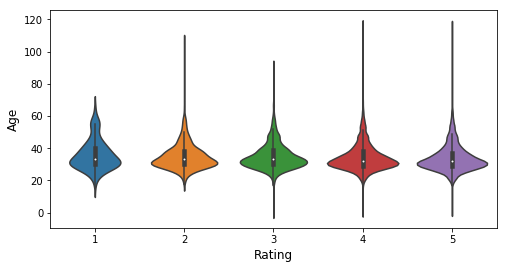

In [12]:
plt.figure(figsize=(8,4))
sns.violinplot(x='rating', y='age', data=train)
plt.xlabel('Rating', fontsize=12)
plt.ylabel('Age', fontsize=12)
plt.show()

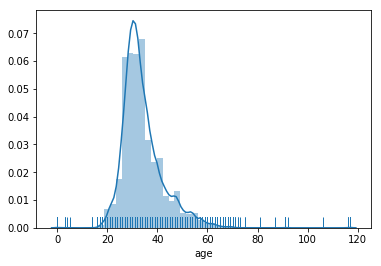

In [13]:
sns.distplot(train['age'], kde=True, rug=True)

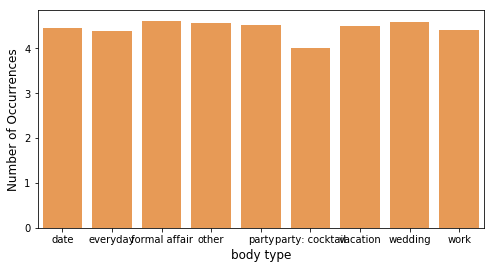

In [14]:
int_level = train.groupby('rented for')['rating'].mean()

plt.figure(figsize=(8,4))
sns.barplot(int_level.index, int_level.values, alpha=0.8, color=color[1])
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('body type', fontsize=12)
plt.show()

In [90]:
from datetime import datetime
dataset['review_date'] = dataset['review_date'].apply(lambda x: datetime.strptime(x, '%Y-%m-%d'))


In [16]:
wordCount = defaultdict(int)
punctuation = set(string.punctuation)
for d in train['review_text']:
    for w in d.split():
        wordCount[w] += 1
print(len(wordCount))

16784


In [17]:
counts = [(wordCount[w], w) for w in wordCount]
counts.sort()
counts.reverse()
counts[:10]

[(56958, 'dress'),
 (24229, 'fit'),
 (18820, 'size'),
 (17916, 'wear'),
 (14402, 'would'),
 (13068, 'love'),
 (12514, 'wore'),
 (11766, 'great'),
 (11442, 'littl'),
 (11165, 'perfect')]

In [18]:
common_words  = [tuple[1] for tuple in counts[:5000]]

In [19]:
corpus = list(train['review_text'])
vectorizer = CountVectorizer(vocabulary = common_words)
X = vectorizer.fit_transform(corpus)
Y = train['rating']

In [22]:
sm = SMOTE(random_state=2)
X_train_res, y_train_res = sm.fit_sample(X, Y)

In [24]:
X_val = vectorizer.fit_transform(list(validation['review_text']))
Y_val = validation['rating']

In [33]:
clf = LogisticRegression(C = 1).fit(X, Y)
clf.score(X_val, Y_val)

0.6822

In [118]:
mean_squared_error([train['rating'].mean()]*len(validation), clf.predict(X_val))

0.21410905562500016

In [35]:
f1_score(Y_val, clf.predict(X_val), average = 'micro')

0.6822

In [36]:
f1_score(Y_val, [5]*len(Y_val), average = 'micro')

0.6464

In [109]:
from sklearn.ensemble import RandomForestClassifier

In [178]:
clf = RandomForestClassifier(n_estimators=1000, max_depth=10,random_state=0).fit(X, Y)
clf.score(X_val, Y_val)

0.6464

In [140]:
np.mean(pd.Series(clf.predict(X_val)) == 5)

1.0

In [177]:
(validation['rating'] == 5).mean()

0.6464

In [156]:
from gensim.test.utils import common_texts
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(train['review_text'])]


In [165]:
model = Doc2Vec(documents, vector_size=50, window=3, min_count=1, workers=4)

In [166]:
X = [model.infer_vector(w.split()) for w in train['review_text']]

In [167]:
X_val = [model.infer_vector(w.split()) for w in validation['review_text']]

In [168]:
clf = LogisticRegression(C = 0.01).fit(X, Y)
clf.score(X_val, Y_val)

/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


0.6464

In [170]:
np.mean(clf.predict(X_val))

5.0

In [168]:
len(yelp['user_id'].unique())

303066

In [6]:
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
import spacy

In [7]:
max_num_words = 1000
max_seq_length = 100
tokenizer = Tokenizer(num_words=max_num_words)

In [8]:
texts = yelp["text"].values
labels = yelp["stars"].values
tokenizer.fit_on_texts(texts)
sequences = tokenizer.texts_to_sequences(texts)
word_index = tokenizer.word_index
len(word_index)

60237

In [9]:
data = pad_sequences(sequences, maxlen=max_seq_length)
data

array([[  0,   0,   0, ..., 289,  26,  37],
       [ 56,  49,   1, ..., 119,  33, 219],
       [  0,   0,   0, ..., 389, 502,  87],
       ...,
       [  0,   0,   0, ...,   3,  81, 146],
       [  0,   0,   0, ...,  60,  16,  29],
       [  0,   0,   0, ...,  30,  10,   2]], dtype=int32)

In [10]:
labels = to_categorical(np.asarray(labels))

In [11]:
labels[:1]

array([[0., 1., 0., 0., 0., 0.]], dtype=float32)

In [12]:
x_train = data[:-10000]
y_train = labels[:-10000]
x_val = data[-10000:-5000]
y_val = labels[-10000:-5000]
x_test = data[-5000:]
y_test = labels[-5000:]

In [13]:
embedding_index = {}

f = open('glove.6B.100d.txt')
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:],dtype='float32')
    embedding_index[word] = coefs
f.close()

print('found word vecs: ',len(embedding_index))

found word vecs:  400000


In [14]:
embedding_dim = 100
embedding_matrix = np.zeros((len(word_index)+1,embedding_dim))
embedding_matrix.shape

(60238, 100)

In [15]:
for word,i in word_index.items():
    embedding_vector = embedding_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

In [16]:
from keras.layers import Embedding
embedding_layer = Embedding(len(word_index)+1,embedding_dim,weights=[embedding_matrix],\
                            input_length=max_seq_length,trainable=False)

In [17]:
from keras.layers import Bidirectional,GlobalMaxPool1D,Conv1D
from keras.layers import LSTM,Input,Dense,Dropout,Activation
from keras.models import Model

In [130]:
inp = Input(shape=(max_seq_length,))
x = embedding_layer(inp)
x = Bidirectional(LSTM(100,return_sequences=True,dropout=0.2,recurrent_dropout=0.2))(x)
x = GlobalMaxPool1D()(x)
x = Dense(100,activation='relu')(x)
x = Dropout(0.2)(x)
x = Dense(6,activation='softmax')(x)
model = Model(inputs=inp,outputs=x)

In [131]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])


In [114]:
training_errors = []
validation_errors = []
training_accuracy = []
validation_accuracy = []

In [126]:
for i in range(10):
    model.fit(x_train,y_train,validation_data=(x_val,y_val),epochs=1,batch_size=128);
    
    val_pred = model.predict(x_val)
    predictions = pd.DataFrame(val_pred).apply(lambda x: x.idxmax(), axis= 1)
    validation_errors.append(MSE(predictions, yelp[-10000:-5000].stars))
    validation_accuracy.append((predictions == yelp[-10000:-5000].stars.values).mean())
    
    train_pred = model.predict(x_train)
    predictions = pd.DataFrame(train_pred).apply(lambda x: x.idxmax(), axis= 1)
    training_errors.append(MSE(predictions, yelp[:-10000].stars))
    training_accuracy.append((predictions == yelp[:-10000].stars.values).mean())


Train on 40000 samples, validate on 5000 samples
Epoch 1/1
40000/40000 [==============================] - 86s 2ms/step - loss: 0.2271 - accuracy: 0.8975 - val_loss: 0.2301 - val_accuracy: 0.8955
Train on 40000 samples, validate on 5000 samples
Epoch 1/1
40000/40000 [==============================] - 87s 2ms/step - loss: 0.2240 - accuracy: 0.8987 - val_loss: 0.2302 - val_accuracy: 0.8962
Train on 40000 samples, validate on 5000 samples
Epoch 1/1
40000/40000 [==============================] - 88s 2ms/step - loss: 0.2213 - accuracy: 0.9000 - val_loss: 0.2299 - val_accuracy: 0.8969
Train on 40000 samples, validate on 5000 samples
Epoch 1/1
40000/40000 [==============================] - 93s 2ms/step - loss: 0.2184 - accuracy: 0.9012 - val_loss: 0.2298 - val_accuracy: 0.8962
Train on 40000 samples, validate on 5000 samples
Epoch 1/1
40000/40000 [==============================] - 94s 2ms/step - loss: 0.2171 - accuracy: 0.9014 - val_loss: 0.2285 - val_accuracy: 0.8975
Train on 40000 samples, v

In [132]:
model.fit(x_train,y_train,validation_data=(x_val,y_val),epochs=14,batch_size=128)

Train on 40000 samples, validate on 5000 samples
Epoch 1/14
40000/40000 [==============================] - 85s 2ms/step - loss: 0.3231 - accuracy: 0.8604 - val_loss: 0.2778 - val_accuracy: 0.8776
Epoch 2/14
40000/40000 [==============================] - 3109s 78ms/step - loss: 0.2748 - accuracy: 0.8796 - val_loss: 0.2568 - val_accuracy: 0.8865
Epoch 3/14
40000/40000 [==============================] - 83s 2ms/step - loss: 0.2605 - accuracy: 0.8850 - val_loss: 0.2448 - val_accuracy: 0.8900
Epoch 4/14
40000/40000 [==============================] - 83s 2ms/step - loss: 0.2524 - accuracy: 0.8876 - val_loss: 0.2404 - val_accuracy: 0.8919
Epoch 5/14
40000/40000 [==============================] - 84s 2ms/step - loss: 0.2464 - accuracy: 0.8900 - val_loss: 0.2381 - val_accuracy: 0.8925
Epoch 6/14
40000/40000 [==============================] - 85s 2ms/step - loss: 0.2427 - accuracy: 0.8912 - val_loss: 0.2362 - val_accuracy: 0.8940
Epoch 7/14
40000/40000 [==============================] - 88s 2ms/

In [173]:
model.fit(x_train,y_train,validation_data=(x_val,y_val),epochs=1,batch_size=128)

ValueError: Error when checking target: expected dense_16 to have shape (6,) but got array with shape (1,)

In [140]:
test_pred = model.predict(x_test)
predictions = pd.DataFrame(test_pred).apply(lambda x: x.idxmax(), axis= 1)
print(MSE(predictions, yelp[-5000:].stars))
print((predictions == yelp[-5000:].stars.values).mean())

0.7894
0.6674


In [141]:
from sklearn.metrics import confusion_matrix
confusion_matrix(test['stars'].values,  predictions)

array([[ 575,   55,   13,    7,   31],
       [ 149,  127,   80,   37,   16],
       [  64,   73,  180,  180,   49],
       [  26,   15,  108,  561,  390],
       [  53,    7,   14,  296, 1894]])

In [133]:
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

In [153]:
iris = datasets.load_iris()
X = iris.data
y = iris.target
class_names = iris.target_names

# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

# Run classifier, using a model that is too regularized (C too low) to see
# the impact on the results
classifier = svm.SVC(kernel='linear', C=0.01)
y_pred = classifier.fit(X_train, y_train).predict(X_test)

In [152]:
from sklearn import svm, datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels

iris = datasets.load_iris()
iris.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [155]:
confusion_matrix(y_test, y_pred)

array([[13,  0,  0],
       [ 0, 10,  6],
       [ 0,  0,  9]])

In [165]:
test['stars'].values.astype(int) - 1

array([4, 2, 4, ..., 3, 1, 4])

In [159]:
unique_labels(test['stars'].values, predictions)

array([1., 2., 3., 4., 5.])

In [158]:
np.array([1,2,3,4,5])[unique_labels(test['stars'].values, predictions)]

IndexError: arrays used as indices must be of integer (or boolean) type

Normalized confusion matrix
[[0.84434655 0.08076358 0.01908957 0.010279   0.04552129]
 [0.36430318 0.31051345 0.19559902 0.09046455 0.0391198 ]
 [0.11721612 0.13369963 0.32967033 0.32967033 0.08974359]
 [0.02363636 0.01363636 0.09818182 0.51       0.35454545]
 [0.02340989 0.00309187 0.00618375 0.13074205 0.83657244]]


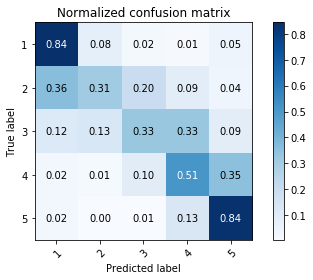

In [168]:
plot_confusion_matrix(test['stars'].values.astype(int) - 1,  predictions - 1, classes=np.array([1,2,3,4,5]), normalize=True,
                      title='Normalized confusion matrix')

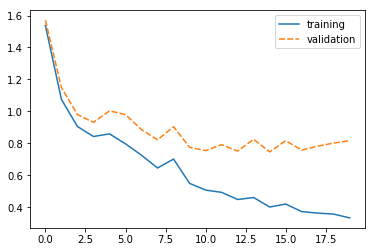

In [45]:
df = pd.DataFrame(data = {'training': training_errors, 'validation': validation_errors})
sns.lineplot(data=df)

In [54]:
validation_acc = [i for i in validation_accuracy if validation_accuracy.index(i) % 2 == 0]
training_accuracy = [i for i in validation_accuracy if validation_accuracy.index(i) % 2 != 0]

In [63]:
validation_acc.index(max(validation_acc))

10

In [66]:
max(validation_acc)

0.6692

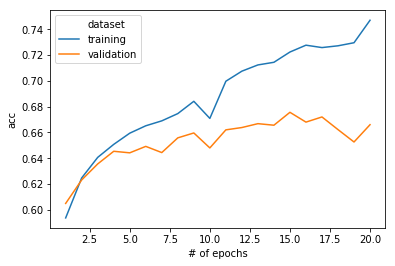

In [177]:
df = pd.DataFrame(data = {'acc': list(df_2['train_acc']) + list(df_2['validation_acc']), 'dataset': ['training']*20 + ['validation']*20, \
                         '# of epochs': list(range(1,21)) + list(range(1,21))})
ax = sns.lineplot(x="# of epochs", y="acc", hue="dataset", data=df)

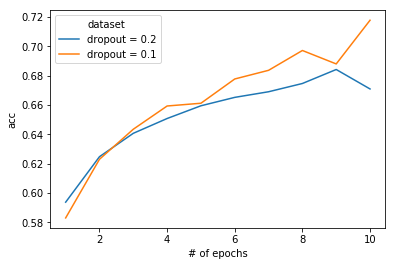

In [124]:
df = pd.DataFrame(data = {'acc': training_accuracy + list(df_1['train_acc'])[:10], 'dataset': ['dropout = 0.2']*10 + ['dropout = 0.1']*10, \
                         '# of epochs': list(range(1,11)) + list(range(1,11))})
ax = sns.lineplot(x="# of epochs", y="acc", hue="dataset", data=df)

In [79]:
df_1 = pd.DataFrame(data = {'train_error': training_errors, 'validation_error': validation_errors, \
                         'train_acc': training_accuracy,'validation_acc': validation_acc,})
df_1

,train_error,validation_error,train_acc,validation_acc
0,1.536325,1.5704,0.583050,0.5888
1,1.074900,1.1492,0.623000,0.6224
2,0.905075,0.9798,0.643450,0.6372
3,0.842825,0.9314,0.659275,0.6484
4,0.859050,1.0032,0.661150,0.6476
5,0.796775,0.9800,0.677675,0.6572
6,0.725375,0.8856,0.683575,0.6600
7,0.645750,0.8220,0.697075,0.6682
8,0.701375,0.9036,0.687925,0.6580
9,0.549250,0.7748,0.717675,0.6680


In [128]:
df_2 = pd.DataFrame(data = {'train_error': training_errors, 'validation_error': validation_errors, \
                         'train_acc': training_accuracy,'validation_acc': validation_accuracy,})
df_2

,train_error,validation_error,train_acc,validation_acc
0,1.147725,1.2152,0.593775,0.6050
1,1.097675,1.1898,0.624750,0.6232
2,0.981550,1.0728,0.640675,0.6356
3,0.951150,1.0414,0.650750,0.6454
4,0.823850,0.9456,0.659425,0.6442
5,0.828200,0.9368,0.665150,0.6492
6,0.807600,0.9274,0.668975,0.6444
7,0.759350,0.8884,0.674600,0.6558
8,0.712000,0.8870,0.684125,0.6596
9,0.887350,1.0322,0.670875,0.6480


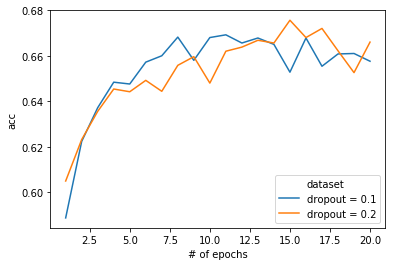

In [172]:
df = pd.DataFrame(data = {'acc': list(df_1['validation_acc']) + list(df_2['validation_acc']), 'dataset': ['dropout = 0.1']*20 + ['dropout = 0.2']*20, \
                         '# of epochs': list(range(1,21)) + list(range(1,21))})
ax = sns.lineplot(x="# of epochs", y="acc", hue="dataset", data=df)

In [129]:
max(df_2['validation_acc'])

0.6756

In [127]:
MSE(predictions, yelp[-5000:].stars)

0.8138

In [128]:
(predictions == yelp[-5000:].stars.values).mean()

0.6536